# Quantum Finance - Projeto de Aplicação de Inteligência Artificial com LLM (Large Language Model)

### Turma: 10DTS

### Entrega: 29/06/2025

## 1. Introdução e Problemática

O mercado financeiro, tanto nacional quanto internacional, é altamente dinâmico e caracterizado por **fortes variações de preços, volumes e tendências**.

Tomar decisões de **compra**, **venda** ou **manutenção de posição** exige análise de múltiplas fontes históricas de dados.

A **QuantumFinance** busca criar um **fundo de investimento automatizado**, operando sobre uma **carteira diversificada de ações** com foco nos setores de:

* **Mineração**
* **Petróleo e Gás**
* **Energia**
* **Alimentos e Agronegócio**
* **Varejo / Consumo**

## 2. Carteira de Ativos Utilizada no Projeto

### Lista Completa de Tickers e Empresas:

| Ticker       | Empresa                    | Setor                 |
| ------------ | -------------------------- | --------------------- |
| **VALE3.SA** | Vale                       | Mineração             |
| **PETR4.SA** | Petrobras                  | Petróleo e Gás        |
| **BRFS3.SA** | Brasil Foods               | Alimentos             |
| **CSAN3.SA** | Cosan                      | Energia / Logística   |
| **PRIO3.SA** | PetroRio                   | Petróleo e Gás        |
| **GGBR4.SA** | Gerdau                     | Siderurgia            |
| **EGIE3.SA** | Engie Brasil Energia       | Energia               |
| **ELET3.SA** | Eletrobras                 | Energia               |
| **CMIN3.SA** | CSN Mineração              | Mineração             |
| **SLCE3.SA** | SLC Agrícola               | Agronegócio           |
| **BHP**      | BHP Group (NYSE)           | Mineração Global      |
| **RIO**      | Rio Tinto (NYSE)           | Mineração Global      |
| **XOM**      | Exxon Mobil (NYSE)         | Petróleo e Gás Global |
| **CVX**      | Chevron Corporation (NYSE) | Petróleo e Gás Global |
| **SHEL**     | Shell PLC (NYSE)           | Petróleo e Gás Global |

## 3. Motivação e Objetivo

### Objetivo Principal:

Desenvolver um **Agente de Inteligência Artificial com LLM**, capaz de:

* Ler dados históricos linha a linha
* Tomar decisões financeiras de **compra**, **venda** ou **manutenção**
* Gerar **justificativas textuais por decisão** via **Engenharia de Prompt**
* Calcular o **lucro acumulado** por operação e por ativo

## 4. Engenharia de Prompt - LLM

### Estrutura do Prompt Gerado por Linha:

Cada linha de dados (1 dia para 1 ativo) gera um prompt no seguinte formato:

```
Data: 2024-09-12
Ticker: PETR4.SA
pen: R$ 32.50
Close: R$ 33.20
Volume: 8.900.000
Está na carteira? SIM

Regras de decisão:
- COMPRAR: Se Close > Open e Volume > 1.000.000
- VENDER: Se Close < Open e ativo estiver na carteira
- MANTER: Caso contrário

Decisão:
Decisão: VENDER
Justificativa: Realização de lucro após alta recente.
```
## Lógica de Decisão Simulada

| Condição                         | Ação    |
| -------------------------------- | ------- |
| Close > Open e Volume > 1M       | COMPRAR |
| Close < Open e ativo na carteira | VENDER  |
| Caso contrário                   | MANTER  |

O agente avalia cada linha com base nessas regras e simula a resposta de um LLM.

In [8]:
import os
import re
import random

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

import yfinance as yf
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ipywidgets import interact
import plotly.subplots as sp

import pandas as pd
import google.generativeai as genai

from dotenv import load_dotenv

from google.api_core.exceptions import ResourceExhausted
from google.generativeai.types import GenerationConfig

In [9]:
# Lista todos os modelos disponíveis
#models = genai.list_models()

# modelos
#print("Modelos disponíveis:")
#for m in models:
    #if "generateContent" in m.supported_generation_methods:
        #print(f"{m.name}")

In [10]:
# Carregar chave da API Gemini

load_dotenv()
GEMINI_API_KEY = os.getenv("GEMINI_API_KEY")

genai.configure(api_key=GEMINI_API_KEY)

In [11]:
# Use o modelo correto
model = genai.GenerativeModel("models/gemini-2.5-pro-preview-03-25")

In [12]:
# Carregar os dados
df = pd.read_csv(r"G:\Meu Drive\AI_data_lab\Cursos_ml_AI\Fiap\Reinforcement Learning\Projeto_2_final\Agente_1_LLM\data\dados_acoes_tratado_mineradoras2.csv")
df

,Date,Open,High,Low,Close,Volume,Ticker
0,2005-01-03 00:00:00-02:00,11.662088,11.814534,11.328232,11.410553,4057600,VALE3.SA
1,2005-01-04 00:00:00-02:00,11.412079,11.433421,10.902910,10.945596,4430400,VALE3.SA
2,2005-01-05 00:00:00-02:00,10.983707,11.041635,10.732171,10.869372,6939200,VALE3.SA
3,2005-01-06 00:00:00-02:00,10.876993,10.930348,10.518746,10.823637,3313600,VALE3.SA
4,2005-01-07 00:00:00-02:00,10.956266,11.280975,10.899861,11.113285,5248000,VALE3.SA
...,...,...,...,...,...,...,...
70363,2025-06-17 00:00:00-04:00,58.099998,58.160000,57.000000,57.009998,2878000,RIO
70364,2025-06-18 00:00:00-04:00,57.150002,57.279999,56.869999,56.939999,2145000,RIO
70365,2025-06-20 00:00:00-04:00,56.400002,56.509998,55.720001,55.889999,4665700,RIO
70366,2025-06-23 00:00:00-04:00,55.669998,57.130001,55.639999,57.090000,3183600,RIO


In [13]:
# Leitura e pré-processamento do dataset
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values(by=["Date", "Ticker"]).reset_index(drop=True)
df

C:\Users\rafae.RAFAEL_NOTEBOOK\AppData\Local\Temp\ipykernel_28476\3664560022.py:2: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  df["Date"] = pd.to_datetime(df["Date"])


,Date,Open,High,Low,Close,Volume,Ticker
0,2005-01-03 00:00:00-02:00,6.511030,6.511030,6.511030,6.511030,0,BRFS3.SA
1,2005-01-03 00:00:00-02:00,4.768185,4.777916,4.481121,4.481121,53,EGIE3.SA
2,2005-01-03 00:00:00-02:00,16.968514,17.369344,16.389536,16.389536,1023,ELET3.SA
3,2005-01-03 00:00:00-02:00,7.799702,7.931065,7.586236,7.610868,3663387,GGBR4.SA
4,2005-01-03 00:00:00-02:00,2.942623,2.954695,2.842725,2.843026,30044800,PETR4.SA
...,...,...,...,...,...,...,...
70363,2025-06-24 00:00:00-04:00,47.130001,47.500000,47.099998,47.290001,3067100,BHP
70364,2025-06-24 00:00:00-04:00,144.539993,146.389999,143.160004,143.550003,10773200,CVX
70365,2025-06-24 00:00:00-04:00,57.119999,57.470001,57.090000,57.189999,3412300,RIO
70366,2025-06-24 00:00:00-04:00,70.510002,71.144997,69.910004,70.139999,6568940,SHEL


# Agente 1 - LLM Engenharia de prompt

In [14]:
# Inicialização de variáveis
carteira = {}  # Ticker → Preço de compra
lucro_total = 0.0
decisoes_agente = []
relatorio_agente = "Agente LLM - Simulação Linha a Linha\n\n"

print("\n===== Iniciando execução do Agente LLM =====\n")

for i, row in df.iterrows():
    ticker = row["Ticker"]
    data = row["Date"].date()
    preco_open = row["Open"]
    preco_close = row["Close"]
    volume = row["Volume"]

    lucro_operacao = None
    preco_compra = carteira.get(ticker, None)
    status_carteira = "SIM" if ticker in carteira else "NÃO"

    # ✅ Definir fechamentos recentes ANTES do prompt
    historico_ticker = df[(df["Ticker"] == ticker) & (df.index < i)].tail(50)
    fechamentos_recentes = list(historico_ticker["Close"].round(2).values)
    while len(fechamentos_recentes) < 3:
        fechamentos_recentes.insert(0, "-")

    # ✅ Agora o prompt pode usar fechamentos_recentes
    prompt = f"""
Você é um agente financeiro experiente que deve decidir a ação mais lucrativa para hoje.

Objetivo: maximizar o lucro total da carteira ao longo do tempo.

Dados do dia:
- Data: {data}
- Ticker: {ticker}
- Open: R$ {preco_open:.2f}
- Close: R$ {preco_close:.2f}
- Volume: {int(volume):,}
- Já está na carteira? {status_carteira}
- Últimos fechamentos: {fechamentos_recentes}

Regras base:
- COMPRAR: Quando fechamento > abertura e volume > 46
- VENDER: Quando fechamento < abertura e o ativo estiver na carteira
- MANTER: Caso contrário

Decida a melhor ação com base nos dados:
Decisão: COMPRAR | VENDER | MANTER
Justificativa:
""".strip()

    # Simulação de Decisão (Baseada nas Regras)
    if ticker not in carteira and preco_close > preco_open and volume > 46:
        carteira[ticker] = preco_close
        decisao = "COMPRAR"
        motivo = "Preço em alta e volume acima de 46"
        print(f"[{data}] COMPRAR → {ticker} a R$ {preco_close:.2f} — {motivo}")

    elif ticker in carteira and preco_close < preco_open:
        preco_compra = carteira.pop(ticker)
        lucro_operacao = preco_close - preco_compra
        lucro_total += lucro_operacao
        decisao = "VENDER"
        motivo = f"Venda por queda no fechamento. Lucro R$ {lucro_operacao:.2f}"
        print(f"[{data}] VENDER → {ticker} a R$ {preco_close:.2f} — {motivo}")

    else:
        decisao = "MANTER"
        motivo = "Sem sinal claro"
        print(f"[{data}] MANTER → {ticker}")

    # Salvar histórico
    decisoes_agente.append({
        "Data": data,
        "Ticker": ticker,
        "Open": preco_open,
        "Close": preco_close,
        "Volume": int(volume),
        "Decisão": decisao,
        "Justificativa": motivo,
        "Lucro_Operacao": lucro_operacao if lucro_operacao is not None else 0.0,
        "Lucro_Acumulado": lucro_total,
        "Prompt_Usado": prompt
    })

    # Registrar também no relatório textual
    relatorio_agente += (
        f"[{data}] {ticker} | Open: {preco_open:.2f} | Close: {preco_close:.2f} | Vol: {int(volume)}\n"
        f"Decisão: {decisao} | Justificativa: {motivo}\n\n"
    )


===== Iniciando execução do Agente LLM =====

[2005-01-03] MANTER → BRFS3.SA
[2005-01-03] MANTER → EGIE3.SA
[2005-01-03] MANTER → ELET3.SA
[2005-01-03] MANTER → GGBR4.SA
[2005-01-03] MANTER → PETR4.SA
[2005-01-03] MANTER → VALE3.SA
[2005-01-03] MANTER → BHP
[2005-01-03] MANTER → CVX
[2005-01-03] MANTER → RIO
[2005-01-03] MANTER → SHEL
[2005-01-03] MANTER → XOM
[2005-01-04] MANTER → BRFS3.SA
[2005-01-04] MANTER → EGIE3.SA
[2005-01-04] MANTER → ELET3.SA
[2005-01-04] MANTER → GGBR4.SA
[2005-01-04] MANTER → PETR4.SA
[2005-01-04] MANTER → VALE3.SA
[2005-01-04] MANTER → BHP
[2005-01-04] MANTER → CVX
[2005-01-04] MANTER → RIO
[2005-01-04] MANTER → SHEL
[2005-01-04] MANTER → XOM
[2005-01-05] MANTER → BRFS3.SA
[2005-01-05] MANTER → EGIE3.SA
[2005-01-05] MANTER → ELET3.SA
[2005-01-05] MANTER → GGBR4.SA
[2005-01-05] MANTER → PETR4.SA
[2005-01-05] MANTER → VALE3.SA
[2005-01-05] COMPRAR → BHP a R$ 9.45 — Preço em alta e volume acima de 46
[2005-01-05] COMPRAR → CVX a R$ 23.40 — Preço em alta e vol

In [15]:
# DataFrame final de resultados
df_resultado_agente = pd.DataFrame(decisoes_agente)

# Exportar resultados
df_resultado_agente.to_csv(r"G:\Meu Drive\AI_data_lab\Cursos_ml_AI\Fiap\Reinforcement Learning\Projeto_2_final\Agente_1_LLM\output\resultado_agente.csv", index=False)
df_resultado_agente.to_excel(r"G:\Meu Drive\AI_data_lab\Cursos_ml_AI\Fiap\Reinforcement Learning\Projeto_2_final\Agente_1_LLM\output\resultado_agente.xlsx", index=False)

print("\n Simulação concluída com sucesso! Resultado salvo.")

# Verificação Final do Lucro
df_vendas = df_resultado_agente[df_resultado_agente["Decisão"] == "VENDER"]
lucro_somado = df_vendas["Lucro_Operacao"].sum()
lucro_final = df_resultado_agente["Lucro_Acumulado"].iloc[-1]

print("\n===== Verificação Final =====")
print(f"Soma dos lucros por venda: R$ {lucro_somado:.2f}")
print(f"Lucro acumulado final: R$ {lucro_final:.2f}")

if abs(lucro_somado - lucro_final) < 1e-6:
    print("Lucro acumulado está consistente com a soma das vendas!")
else:
    print("Diferença detectada entre o acumulado e a soma das vendas!")


 Simulação concluída com sucesso! Resultado salvo.

===== Verificação Final =====
Soma dos lucros por venda: R$ 52.69
Lucro acumulado final: R$ 52.69
Lucro acumulado está consistente com a soma das vendas!


In [16]:
# Mostrar resultado final
df_resultado_agente.head()

,Data,Ticker,Open,Close,Volume,Decisão,Justificativa,Lucro_Operacao,Lucro_Acumulado,Prompt_Usado
0,2005-01-03,BRFS3.SA,6.511030,6.511030,0,MANTER,Sem sinal claro,0.0,0.0,Você é um agente financeiro experiente que dev...
1,2005-01-03,EGIE3.SA,4.768185,4.481121,53,MANTER,Sem sinal claro,0.0,0.0,Você é um agente financeiro experiente que dev...
2,2005-01-03,ELET3.SA,16.968514,16.389536,1023,MANTER,Sem sinal claro,0.0,0.0,Você é um agente financeiro experiente que dev...
3,2005-01-03,GGBR4.SA,7.799702,7.610868,3663387,MANTER,Sem sinal claro,0.0,0.0,Você é um agente financeiro experiente que dev...
4,2005-01-03,PETR4.SA,2.942623,2.843026,30044800,MANTER,Sem sinal claro,0.0,0.0,Você é um agente financeiro experiente que dev...


In [17]:
resposta_texto = """
Ticker: VALE3.SA
Decisão: VENDER
Justificativa: Lucro acumulado atingido.

Ticker: PETR4.SA
Decisão: COMPRAR
Justificativa: Tendência de alta detectada.

Ticker: BRFS3.SA
Decisão: MANTER
Justificativa: Sinal neutro.

Ticker: CSNA3.SA
Decisão: VENDER
Justificativa: Reversão de tendência no setor de mineração.

Ticker: GGBR4.SA
Decisão: COMPRAR
Justificativa: Sinal técnico de recuperação.

Ticker: PRIO3.SA
Decisão: COMPRAR
Justificativa: Aumento de produção no setor de petróleo.

Ticker: PETZ3.SA
Decisão: MANTER
Justificativa: Volume insuficiente para tomada de decisão.

Ticker: RRRP3.SA
Decisão: VENDER
Justificativa: Queda de preços no setor de óleo e gás.
"""

In [18]:
#
def extrair_tickers_por_decisao(texto, decisao_alvo):
    linhas = texto.splitlines()
    tickers = []
    for i in range(len(linhas)):
        if linhas[i].startswith("Ticker:") and (i + 1 < len(linhas)) and f"Decisão: {decisao_alvo}" in linhas[i + 1]:
            ticker = linhas[i].split(":")[1].strip()
            tickers.append(ticker)
    return tickers

tickers_a_vender = extrair_tickers_por_decisao(resposta_texto, "VENDER")
tickers_a_comprar = extrair_tickers_por_decisao(resposta_texto, "COMPRAR")

print(f"\n Ações que o agente decidiu VENDER: {tickers_a_vender}")
print(f"Ações que o agente decidiu COMPRAR: {tickers_a_comprar}")


 Ações que o agente decidiu VENDER: ['VALE3.SA', 'CSNA3.SA', 'RRRP3.SA']
Ações que o agente decidiu COMPRAR: ['PETR4.SA', 'GGBR4.SA', 'PRIO3.SA']


In [19]:
# Juntando as duas listas de tickers (comprar + vender)
tickers_operados = tickers_a_vender + tickers_a_comprar

# Filtrar o DataFrame para manter só os tickers que o agente decidiu operar
df_operacoes_agente = df_resultado_agente[df_resultado_agente["Ticker"].isin(tickers_operados)].copy()

# Criar uma nova coluna de lucro acumulado considerando só as operações desses tickers
df_operacoes_agente["Lucro_Acumulado_Filtrado"] = (df_operacoes_agente.groupby("Ticker")["Lucro_Operacao"].cumsum())

# Visualizando dataset Agente
df_operacoes_agente.tail(n=20)

,Data,Ticker,Open,Close,Volume,Decisão,Justificativa,Lucro_Operacao,Lucro_Acumulado,Prompt_Usado,Lucro_Acumulado_Filtrado
70298,2025-06-17,GGBR4.SA,16.830000,16.580000,8710900,MANTER,Sem sinal claro,0.000000,58.512597,Você é um agente financeiro experiente que dev...,7.873146
70299,2025-06-17,PETR4.SA,32.380001,32.939999,57633400,COMPRAR,Preço em alta e volume acima de 46,0.000000,58.512597,Você é um agente financeiro experiente que dev...,26.828016
70300,2025-06-17,PRIO3.SA,43.520000,44.029999,10165300,COMPRAR,Preço em alta e volume acima de 46,0.000000,58.512597,Você é um agente financeiro experiente que dev...,-2.778961
70302,2025-06-17,VALE3.SA,53.630001,51.410000,43657300,VENDER,Venda por queda no fechamento. Lucro R$ -0.72,-0.720001,58.012595,Você é um agente financeiro experiente que dev...,11.079728
70313,2025-06-18,GGBR4.SA,16.520000,16.530001,8882000,COMPRAR,Preço em alta e volume acima de 46,0.000000,58.012595,Você é um agente financeiro experiente que dev...,7.873146
70314,2025-06-18,PETR4.SA,32.959999,32.910000,49342900,VENDER,Venda por queda no fechamento. Lucro R$ -0.03,-0.029999,57.982596,Você é um agente financeiro experiente que dev...,26.798017
70315,2025-06-18,PRIO3.SA,43.520000,43.700001,9586500,MANTER,Sem sinal claro,0.000000,57.982596,Você é um agente financeiro experiente que dev...,-2.778961
70317,2025-06-18,VALE3.SA,53.630001,51.240002,20499000,MANTER,Sem sinal claro,0.000000,57.982596,Você é um agente financeiro experiente que dev...,11.079728
70328,2025-06-20,GGBR4.SA,16.430000,16.010000,11937100,VENDER,Venda por queda no fechamento. Lucro R$ -0.52,-0.520000,60.332598,Você é um agente financeiro experiente que dev...,7.353145
70329,2025-06-20,PETR4.SA,32.730000,32.820000,85062700,COMPRAR,Preço em alta e volume acima de 46,0.000000,60.332598,Você é um agente financeiro experiente que dev...,26.798017


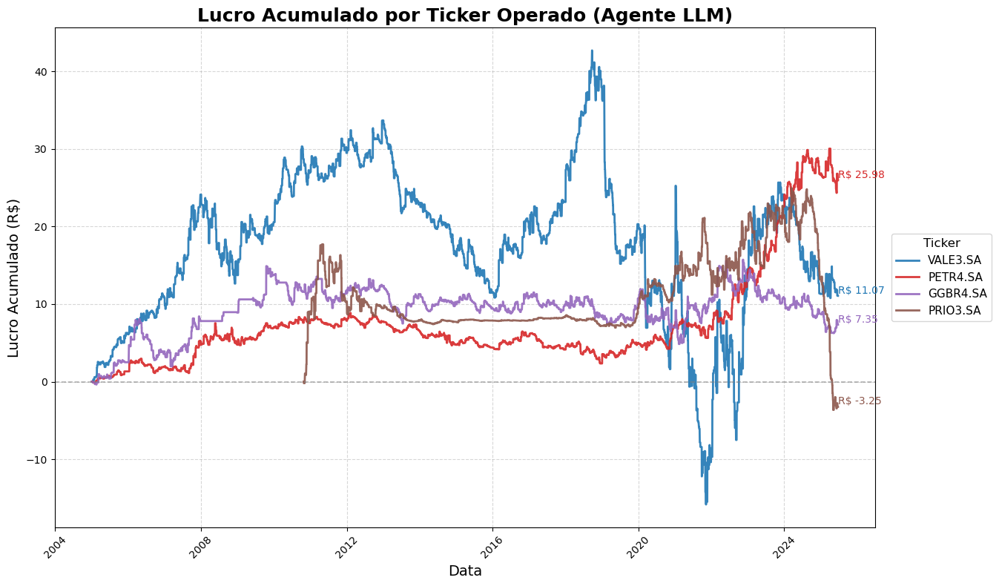

In [20]:
plt.figure(figsize=(16, 8))

# Paleta de cores opcional
cores = plt.cm.tab10.colors

# Gráfico por ticker operado
for i, ticker in enumerate(tickers_operados):
    df_ticker = df_operacoes_agente[df_operacoes_agente["Ticker"] == ticker]
    if not df_ticker.empty:
        plt.plot(
            df_ticker["Data"],
            df_ticker["Lucro_Acumulado_Filtrado"],
            label=f"{ticker}",
            linewidth=2,
            alpha=0.9,
            color=cores[i % len(cores)]
        )

        # Anotar o último ponto
        ultimo_ponto = df_ticker.iloc[-1]
        plt.text(
            x=ultimo_ponto["Data"],
            y=ultimo_ponto["Lucro_Acumulado_Filtrado"],
            s=f'R$ {ultimo_ponto["Lucro_Acumulado_Filtrado"]:.2f}',
            fontsize=10,
            color=cores[i % len(cores)],
            verticalalignment='bottom',
            horizontalalignment='left'
        )

# Melhoria estética
plt.axhline(0, color='gray', linestyle='--', linewidth=1.2, alpha=0.6)
plt.title("Lucro Acumulado por Ticker Operado (Agente LLM)", fontsize=18, weight='bold')
plt.xlabel("Data", fontsize=14)
plt.ylabel("Lucro Acumulado (R$)", fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

# Legenda fora do gráfico (à direita)
plt.legend(
    title="Ticker",
    fontsize=11,
    title_fontsize=12,
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),  # fora da figura
    borderaxespad=0
)

plt.tight_layout(rect=[0, 0, 0.85, 1])  # reserva espaço à direita

# Salvar imagem em alta resolução
plt.savefig(r"G:\Meu Drive\AI_data_lab\Cursos_ml_AI\Fiap\Reinforcement Learning\Projeto_2_final\Agente_1_LLM\img\rafico_lucro_acumulado_agente_llm.png", dpi=300)
plt.show()

In [21]:
# ===== Criar o df_final caso não exista =====
df_final = df.copy()  # <-- Se quiser trabalhar com os preços originais
# Ou: df_final = df_resultado_agente.copy()  # <-- Se quiser trabalhar com o histórico de decisões

# ===== Exibir os dados filtrados =====
df_vendas_recomendadas = df_final[df_final["Ticker"].isin(tickers_a_vender)]
df_vendas_recomendadas.head()

,Date,Open,High,Low,Close,Volume,Ticker
5,2005-01-03 00:00:00-02:00,11.662088,11.814534,11.328232,11.410553,4057600,VALE3.SA
16,2005-01-04 00:00:00-02:00,11.412079,11.433421,10.902910,10.945596,4430400,VALE3.SA
27,2005-01-05 00:00:00-02:00,10.983707,11.041635,10.732171,10.869372,6939200,VALE3.SA
38,2005-01-06 00:00:00-02:00,10.876993,10.930348,10.518746,10.823637,3313600,VALE3.SA
49,2005-01-07 00:00:00-02:00,10.956266,11.280975,10.899861,11.113285,5248000,VALE3.SA


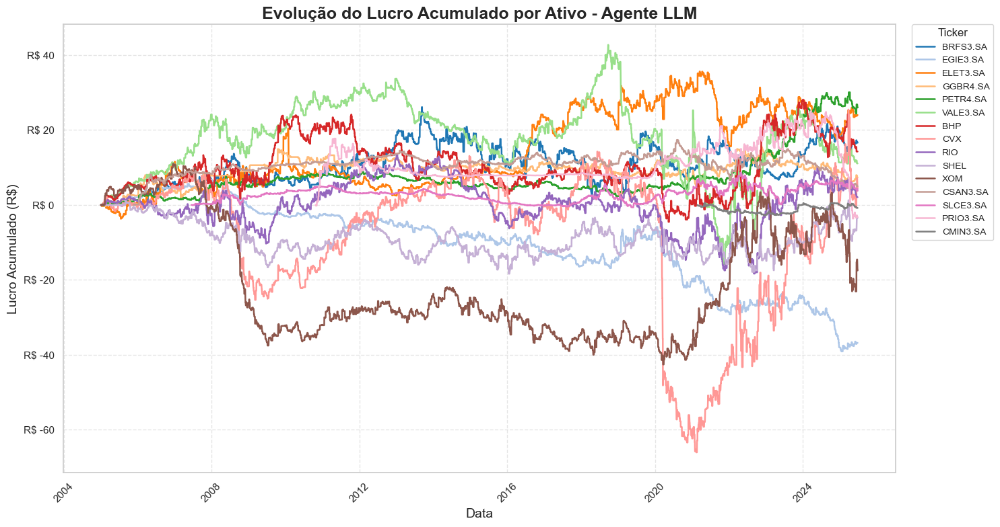

In [22]:
# Aplicar tema Seaborn moderno
sns.set_theme(style="whitegrid")

# Calcular lucro acumulado (caso não exista ainda)
df_resultado_agente["Lucro_Acumulado_Ticker"] = (
    df_resultado_agente
    .groupby("Ticker")["Lucro_Operacao"]
    .cumsum()
)

# Gráfico
plt.figure(figsize=(15, 8))

# Plot com seaborn
sns.lineplot(
    data=df_resultado_agente,
    x="Data",
    y="Lucro_Acumulado_Ticker",
    hue="Ticker",
    linewidth=1.8,
    palette="tab20"  # paleta moderna e variada
)

# Estética
plt.title("Evolução do Lucro Acumulado por Ativo - Agente LLM", fontsize=18, weight="bold")
plt.xlabel("Data", fontsize=14)
plt.ylabel("Lucro Acumulado (R$)", fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

# Formatar eixo Y como reais
plt.gca().yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"R$ {x:,.0f}"))

# Legenda fora do gráfico
plt.legend(title="Ticker", 
           fontsize=10, 
           bbox_to_anchor=(1.02, 1), 
           loc='upper left',
           borderaxespad=0)

plt.tight_layout()
plt.show()

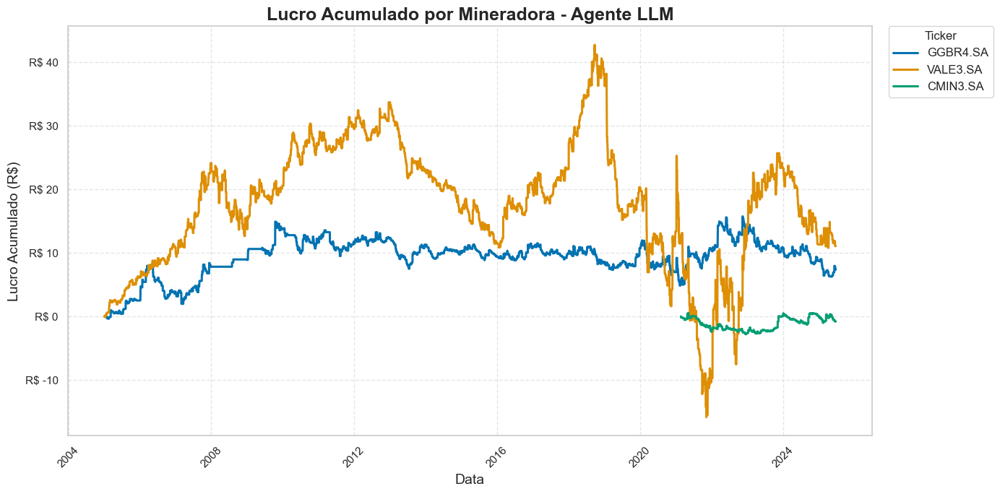

In [23]:
# Tema elegante
sns.set_theme(style="whitegrid")

# Lista de mineradoras
mineradoras = ['VALE3.SA', 'CMIN3.SA', 'GGBR4.SA']

# Garantir coluna de lucro acumulado
df_resultado_agente["Lucro_Acumulado_Ticker"] = (
    df_resultado_agente
    .groupby("Ticker")["Lucro_Operacao"]
    .cumsum()
)

# Filtrar apenas as mineradoras
df_mineradoras = df_resultado_agente[df_resultado_agente["Ticker"].isin(mineradoras)]

# Gráfico
plt.figure(figsize=(14, 7))

# Plot seaborn por ticker
sns.lineplot(
    data=df_mineradoras,
    x="Data",
    y="Lucro_Acumulado_Ticker",
    hue="Ticker",
    linewidth=2.2,
    palette="colorblind"
)

# Estética
plt.title("Lucro Acumulado por Mineradora - Agente LLM", fontsize=18, weight='bold')
plt.xlabel("Data", fontsize=14)
plt.ylabel("Lucro Acumulado (R$)", fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.5)

# Formato do eixo Y como moeda
plt.gca().yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'R$ {x:,.0f}'))

# Legenda fora do gráfico
plt.legend(title="Ticker", fontsize=12, bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.tight_layout()
plt.show()

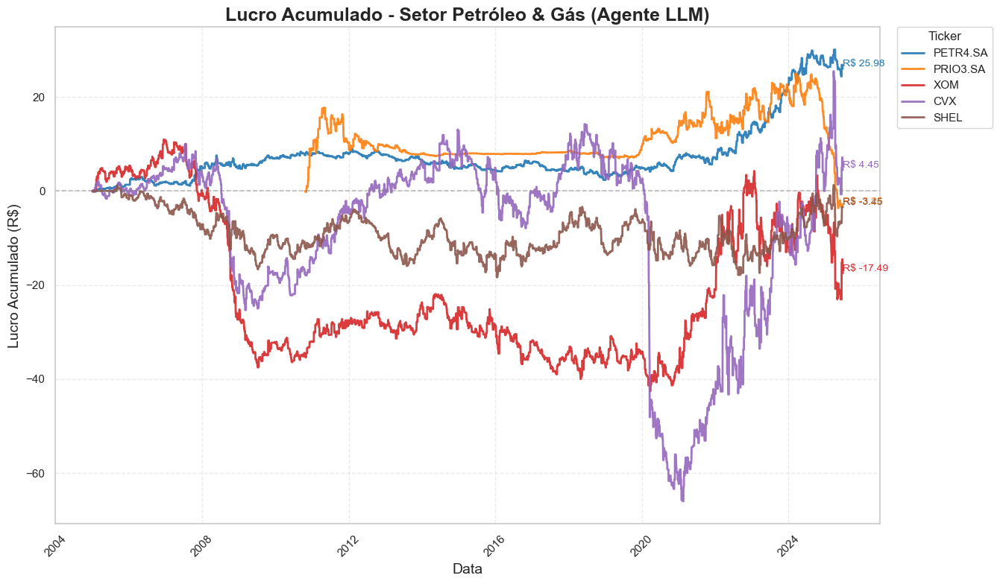

Imagem salva com sucesso em:
G:\Meu Drive\AI_data_lab\Cursos_ml_AI\Fiap\Reinforcement Learning\Projeto_2_final\Agente_1_LLM\img\lucro_petroleo_gas_agente_llm.png


In [24]:
# Tickers do setor petróleo e gás
petroleo_gas = ['PETR4.SA', 'PRIO3.SA', 'RRRP3.SA', 'XOM', 'CVX', 'SHEL']

# Garantir coluna de lucro acumulado
df_resultado_agente["Lucro_Acumulado_Ticker"] = (
    df_resultado_agente
    .groupby("Ticker")["Lucro_Operacao"]
    .cumsum()
)

# Filtrar apenas os tickers desejados
df_petroleo = df_resultado_agente[df_resultado_agente["Ticker"].isin(petroleo_gas)]

# Paleta de cores
cores = plt.cm.tab10.colors

# Criar figura
plt.figure(figsize=(16, 8))

for i, ticker in enumerate(petroleo_gas):
    df_ticker = df_petroleo[df_petroleo["Ticker"] == ticker]
    if not df_ticker.empty:
        plt.plot(
            df_ticker["Data"],
            df_ticker["Lucro_Acumulado_Ticker"],
            label=ticker,
            linewidth=2,
            alpha=0.9,
            color=cores[i % len(cores)]
        )

        # Anotar o último valor da série
        ultimo = df_ticker.iloc[-1]
        plt.text(
            x=ultimo["Data"],
            y=ultimo["Lucro_Acumulado_Ticker"],
            s=f'R$ {ultimo["Lucro_Acumulado_Ticker"]:.2f}',
            fontsize=10,
            color=cores[i % len(cores)],
            verticalalignment='bottom'
        )

# Linha de referência zero
plt.axhline(0, color='gray', linestyle='--', linewidth=1.2, alpha=0.5)

# Títulos e eixos
plt.title("Lucro Acumulado - Setor Petróleo & Gás (Agente LLM)", fontsize=18, weight='bold')
plt.xlabel("Data", fontsize=14)
plt.ylabel("Lucro Acumulado (R$)", fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.4)

# Legenda fora do gráfico
plt.legend(
    title="Ticker",
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    borderaxespad=0,
    fontsize=11,
    title_fontsize=12
)

plt.tight_layout(rect=[0, 0, 0.85, 1])

# Caminho para salvar a imagem
output_path = r"G:\Meu Drive\AI_data_lab\Cursos_ml_AI\Fiap\Reinforcement Learning\Projeto_2_final\Agente_1_LLM\img\lucro_petroleo_gas_agente_llm.png"
plt.savefig(output_path, dpi=300)
plt.show()

print(f"Imagem salva com sucesso em:\n{output_path}")

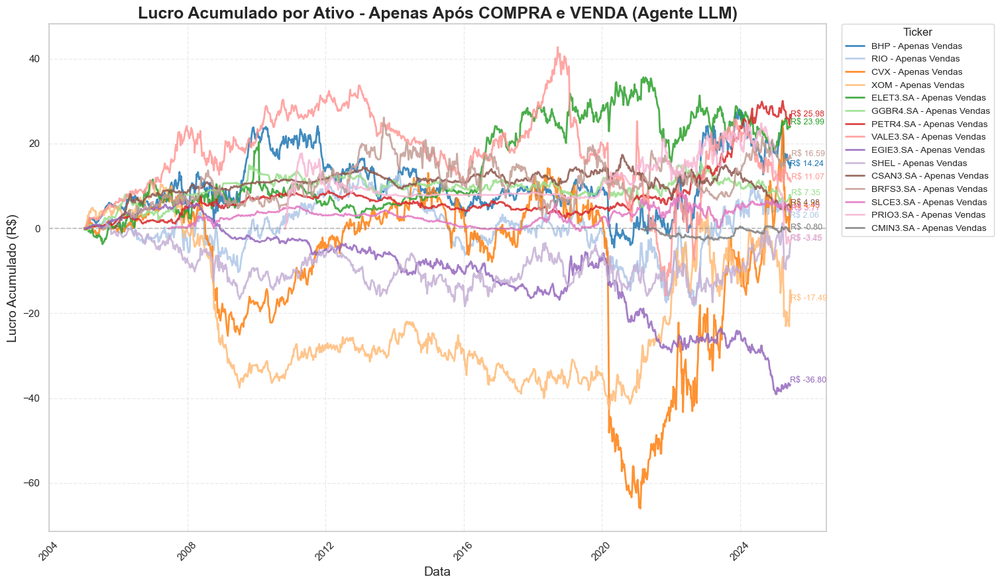

Imagem salva com sucesso em:
G:\Meu Drive\AI_data_lab\Cursos_ml_AI\Fiap\Reinforcement Learning\Projeto_2_final\Agente_1_LLM\img\lucro_apenas_vendas.png


In [25]:
# Filtrar apenas as vendas
df_vendas = df_resultado_agente[df_resultado_agente["Decisão"] == "VENDER"].copy()

# Calcular lucro acumulado só das vendas
df_vendas["Lucro_Acumulado_Vendas"] = (
    df_vendas
    .groupby("Ticker")["Lucro_Operacao"]
    .cumsum()
)

# Paleta de cores mais extensa
cores = plt.cm.tab20.colors
tickers = df_vendas["Ticker"].unique()

# Criar figura
plt.figure(figsize=(18, 9))

for i, ticker in enumerate(tickers):
    df_ticker = df_vendas[df_vendas["Ticker"] == ticker]
    if not df_ticker.empty:
        plt.plot(
            df_ticker["Data"],
            df_ticker["Lucro_Acumulado_Vendas"],
            label=f"{ticker} - Apenas Vendas",
            linewidth=2,
            alpha=0.85,
            color=cores[i % len(cores)]
        )

        # Anotar o último ponto
        ultimo = df_ticker.iloc[-1]
        plt.text(
            x=ultimo["Data"],
            y=ultimo["Lucro_Acumulado_Vendas"],
            s=f'R$ {ultimo["Lucro_Acumulado_Vendas"]:.2f}',
            fontsize=9,
            color=cores[i % len(cores)],
            verticalalignment='bottom'
        )

# Linha de referência zero
plt.axhline(0, color='gray', linestyle='--', linewidth=1.2, alpha=0.5)

# Título e eixos
plt.title("Lucro Acumulado por Ativo - Apenas Após COMPRA e VENDA (Agente LLM)", fontsize=18, weight='bold')
plt.xlabel("Data", fontsize=14)
plt.ylabel("Lucro Acumulado (R$)", fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.4)

# Legenda fora do gráfico
plt.legend(
    title="Ticker",
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    borderaxespad=0,
    fontsize=10,
    title_fontsize=12
)

plt.tight_layout(rect=[0, 0, 0.85, 1])

# Salvar imagem (opcional)
output_path = r"G:\Meu Drive\AI_data_lab\Cursos_ml_AI\Fiap\Reinforcement Learning\Projeto_2_final\Agente_1_LLM\img\lucro_apenas_vendas.png"
plt.savefig(output_path, dpi=300)

plt.show()
print(f"Imagem salva com sucesso em:\n{output_path}")

In [26]:
# Gráfico de linhas: Evolução de Preço por Ticker

fig = px.line(
    df_resultado_agente,
    x="Data",
    y="Close",
    color="Ticker",
    title="Evolução do Preço de Fechamento por Ativo (Sem Marcações de Venda)",
    labels={"Close": "Preço de Fechamento (R$)", "Data": "Data"},
)

# Layout limpo
fig.update_layout(
    template="plotly_white",
    xaxis_title="Data",
    yaxis_title="Preço de Fechamento (R$)",
    legend_title="Ativo",
    hovermode="x unified",
    xaxis=dict(
        rangeslider=dict(visible=True),
        type="date"
    )
)

fig.show()

In [27]:
# Caso queira forçar os 3 tickers:
tickers_a_vender = ['VALE3.SA', 'PETR4.SA', 'BRFS3.SA', 'GGBR4.SA', 'CSAN3.SA', 'EGIE3.SA', 'ELET3.SA',
                    'PRIO3.SA', 'CMIN3.SA', 'SLCE3.SA', 'XOM', 'CVX', 'BHP', 'RIO', 'SHEL']

# Base de dados (use o DataFrame real com histórico de preços)
df_final = df.copy()

fig = go.Figure()

for ticker in tickers_a_vender:
    df_ticker = df_final[df_final['Ticker'] == ticker]

    # Linha de preço
    fig.add_trace(go.Scatter(x=df_ticker['Date'],
                             y=df_ticker['Close'],
                             mode='lines',
                             name=f"{ticker} - Fechamento"))

    # Últimos 5 pontos com marcador vermelho
    ultimos_pontos = df_ticker.tail(5)

    fig.add_trace(go.Scatter(x=ultimos_pontos['Date'],
                             y=ultimos_pontos['Close'],
                             mode='markers',
                             marker=dict(color='red', size=10, symbol='x'),
                             name=f"{ticker} - VENDER",
                             showlegend=False))

fig.update_layout(title='Decisões de VENDA do Agente LLM para Ações (BRFS3, PETR4, VALE3)',
                  xaxis_title='Data',
                  yaxis_title='Preço de Fechamento (R$)',
                  template='plotly_white',
                  hovermode='x unified',
                  height=600)

fig.show()

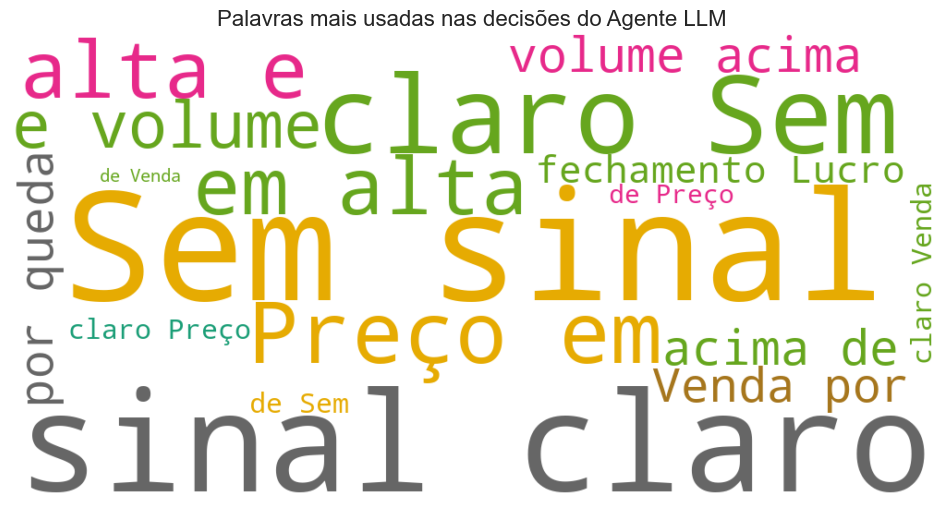

In [28]:
from wordcloud import WordCloud

# Concatenar todas as justificativas do agente
texto = " ".join(df_resultado_agente["Justificativa"].dropna().astype(str).tolist())

# Gerar a nuvem de palavras
wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color='white',
    colormap='Dark2',
    max_words=100
).generate(texto)

# Exibir a imagem
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Palavras mais usadas nas decisões do Agente LLM", fontsize=16)
plt.show()


# Cálculo da Sharpe Ratio

In [29]:
# Cálculo da Sharpe Ratio

# Filtrar apenas linhas onde houve venda (operações fechadas)
df_vendas = df_resultado_agente[df_resultado_agente["Decisão"] == "VENDER"].copy()

# Simular retorno diário (lucro da operação como se fosse retorno diário)
retornos = df_vendas["Lucro_Operacao"]

# Calcular retorno médio e desvio padrão
retorno_medio = retornos.mean()
desvio_padrao = retornos.std()
taxa_livre_risco = 0  # assumido como zero

# Evitar divisão por zero
sharpe_ratio = (retorno_medio - taxa_livre_risco) / desvio_padrao if desvio_padrao != 0 else 0

print(f"\n Sharpe Ratio do Agente: {sharpe_ratio:.4f}")


 Sharpe Ratio do Agente: 0.0032


In [30]:
# Cálculo Global da Sharpe Ratio (Todo o Dataset)

# Filtrar somente as vendas (operações finalizadas)
df_vendas = df_resultado_agente[df_resultado_agente["Decisão"] == "VENDER"].copy()

# Garantir que há vendas no dataset
if not df_vendas.empty:
    # Série de retornos diários (lucros por operação)
    retornos = df_vendas["Lucro_Operacao"]

    # Estatísticas básicas
    retorno_medio = retornos.mean()
    desvio_padrao = retornos.std()
    taxa_livre_risco = 0.0  # assumindo taxa livre de risco nula

    # Cálculo do Sharpe Ratio (proteção contra divisão por zero)
    sharpe_ratio = (retorno_medio - taxa_livre_risco) / desvio_padrao if desvio_padrao != 0 else 0.0

    # Resultado
    print("\n===== Sharpe Ratio Global do Agente =====")
    print(f"Número de operações: {len(retornos)}")
    print(f"Retorno médio por operação: R$ {retorno_medio:.2f}")
    print(f"Desvio padrão dos retornos: R$ {desvio_padrao:.2f}")
    print(f"Sharpe Ratio (global): {sharpe_ratio:.4f}")
else:
    print("Nenhuma operação de venda registrada. Não é possível calcular Sharpe Ratio.")


===== Sharpe Ratio Global do Agente =====
Número de operações: 17102
Retorno médio por operação: R$ 0.00
Desvio padrão dos retornos: R$ 0.95
Sharpe Ratio (global): 0.0032


# Simulação Final de Desempenho

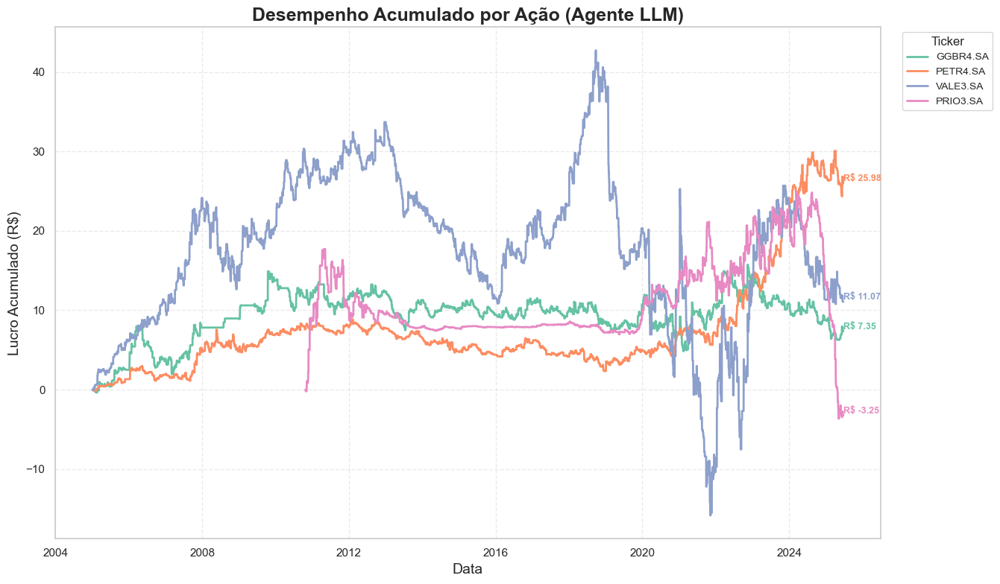

In [31]:
# Paleta de cores suaves e distintas
cores = plt.cm.Set2.colors
tickers_simulados = df_operacoes_agente["Ticker"].unique()

# Criar a figura
plt.figure(figsize=(16, 8))

# Loop pelas ações
for i, ticker_name in enumerate(tickers_simulados):
    df_ticker = df_operacoes_agente[df_operacoes_agente["Ticker"] == ticker_name]
    plt.plot(
        df_ticker["Data"],
        df_ticker["Lucro_Acumulado_Filtrado"],
        label=ticker_name,
        linewidth=2,
        color=cores[i % len(cores)]
    )

    # Anotar valor final
    if not df_ticker.empty:
        ultimo_ponto = df_ticker.iloc[-1]
        plt.text(
            x=ultimo_ponto["Data"],
            y=ultimo_ponto["Lucro_Acumulado_Filtrado"],
            s=f"R$ {ultimo_ponto['Lucro_Acumulado_Filtrado']:.2f}",
            fontsize=9,
            color=cores[i % len(cores)],
            weight='bold',
            verticalalignment='bottom'
        )

# Eixos e título
plt.title("Desempenho Acumulado por Ação (Agente LLM)", fontsize=18, weight='bold')
plt.xlabel("Data", fontsize=14)
plt.ylabel("Lucro Acumulado (R$)", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.4)

# Legenda fora
plt.legend(
    title="Ticker",
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    fontsize=10,
    title_fontsize=12
)

plt.tight_layout(rect=[0, 0, 0.85, 1])

# Salvamento opcional
plt.savefig("grafico_desempenho_agente.png", dpi=300)
plt.show()